In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [5]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [6]:
class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
        return self.gen

In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples,z_dim,device=device)

In [8]:
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

In [9]:
class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        return self.disc

In [12]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [14]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    fake_images = gen(noise)
    disc_fake_pred = disc(fake_images.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [15]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    fake_images = gen(noise)
    disc_fake_pred = disc(fake_images)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

Epoch 1, step 500: Generator loss: 1.387907715439796, discriminator loss: 0.4191928860545156


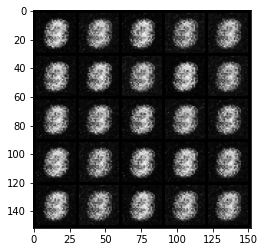

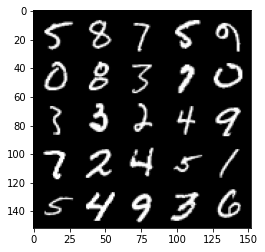

Epoch 2, step 1000: Generator loss: 1.6656649403572084, discriminator loss: 0.30167908096313467


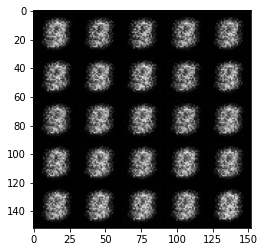

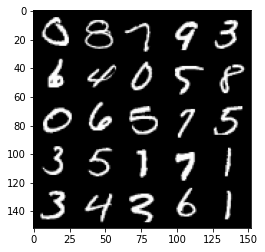

Epoch 3, step 1500: Generator loss: 1.959716683626174, discriminator loss: 0.17518128722906123


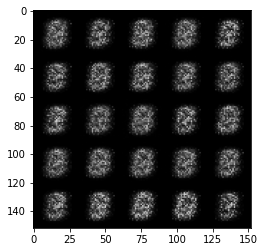

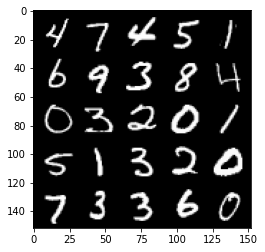

Epoch 4, step 2000: Generator loss: 1.7716215369701374, discriminator loss: 0.19534083950519543


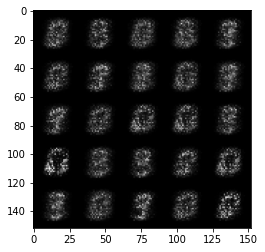

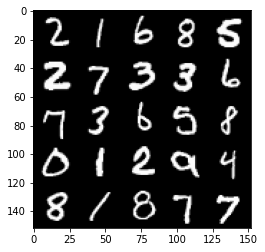

Epoch 5, step 2500: Generator loss: 1.7397073733806607, discriminator loss: 0.19361094507575036


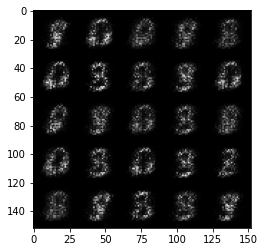

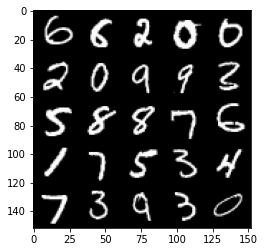

Epoch 6, step 3000: Generator loss: 2.0334717752933504, discriminator loss: 0.14813575100898746


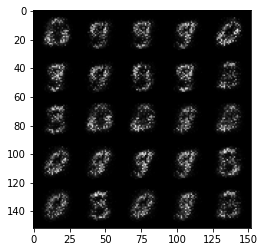

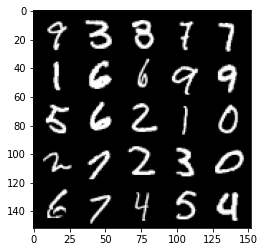

Epoch 7, step 3500: Generator loss: 2.360733360767362, discriminator loss: 0.1352903134971858


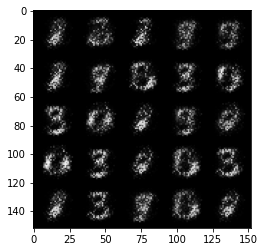

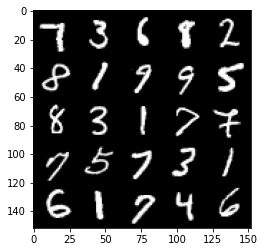

Epoch 8, step 4000: Generator loss: 2.7239338302612284, discriminator loss: 0.11967953263223173


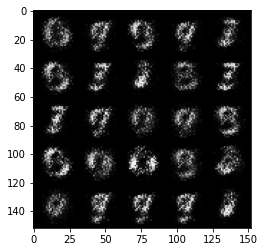

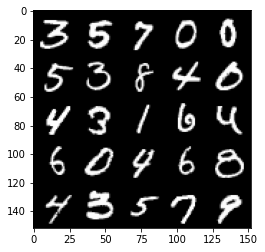

Epoch 9, step 4500: Generator loss: 3.1220551791191076, discriminator loss: 0.09854517991840846


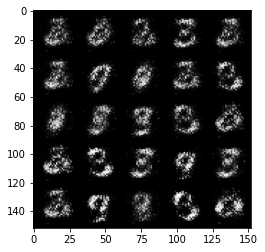

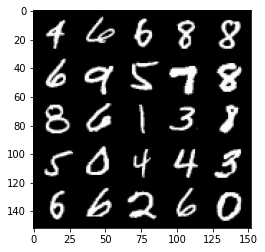

Epoch 10, step 5000: Generator loss: 3.4036317849159246, discriminator loss: 0.08568359950929873


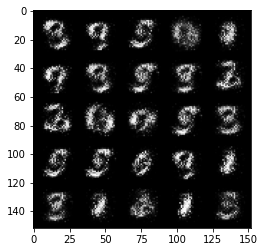

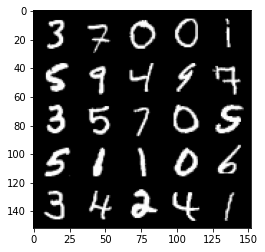

Epoch 11, step 5500: Generator loss: 3.7191868500709573, discriminator loss: 0.0726955992802978


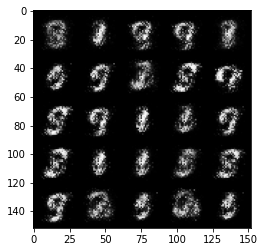

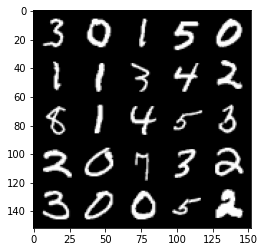

Epoch 12, step 6000: Generator loss: 3.7665612478256216, discriminator loss: 0.06949476575106377


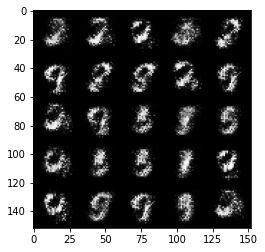

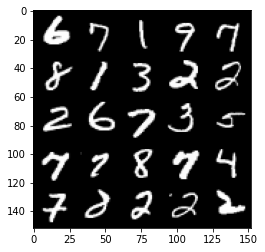

Epoch 13, step 6500: Generator loss: 3.919236956596375, discriminator loss: 0.06014274677634242


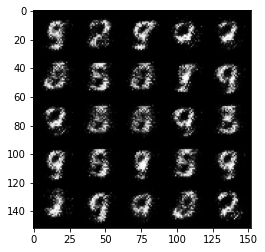

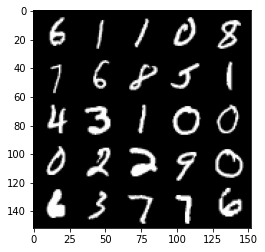

Epoch 14, step 7000: Generator loss: 3.8621145238876338, discriminator loss: 0.054486809778958534


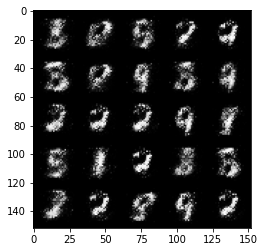

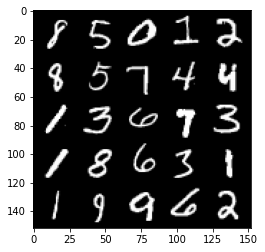

Epoch 15, step 7500: Generator loss: 4.302470403194428, discriminator loss: 0.04595328515768051


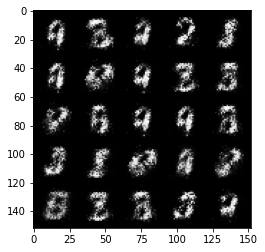

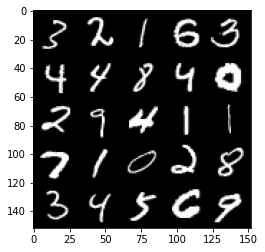

Epoch 17, step 8000: Generator loss: 4.3078694415092444, discriminator loss: 0.048418868623673936


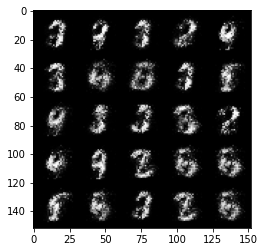

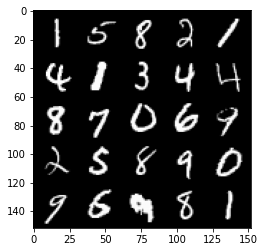

Epoch 18, step 8500: Generator loss: 4.073684840679167, discriminator loss: 0.06075424534454943


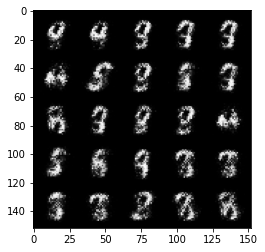

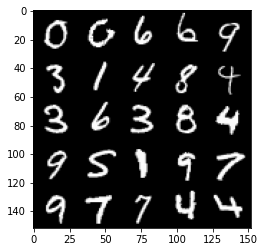

Epoch 19, step 9000: Generator loss: 3.884601878166196, discriminator loss: 0.06588221990689637


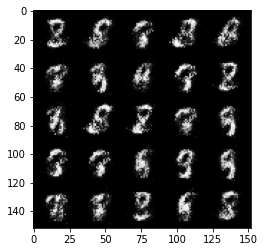

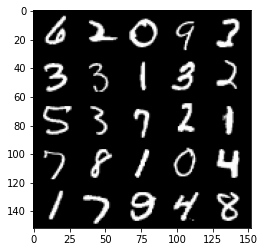

Epoch 20, step 9500: Generator loss: 3.9403550872802744, discriminator loss: 0.06490542353317139


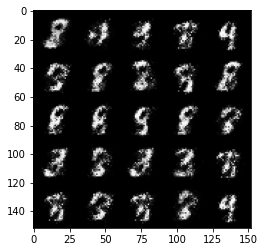

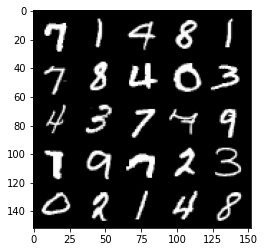

Epoch 21, step 10000: Generator loss: 4.009362997055056, discriminator loss: 0.06307120069488886


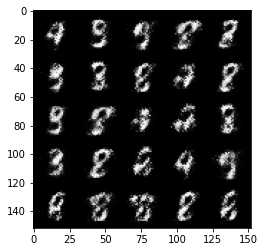

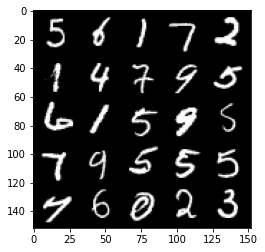

Epoch 22, step 10500: Generator loss: 3.8167363572120636, discriminator loss: 0.07189227356016627


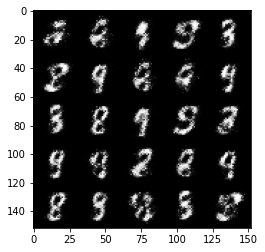

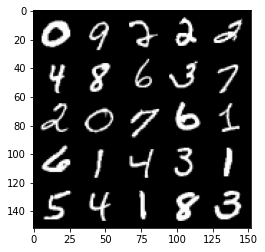

Epoch 23, step 11000: Generator loss: 3.91087919521332, discriminator loss: 0.06299411360174426


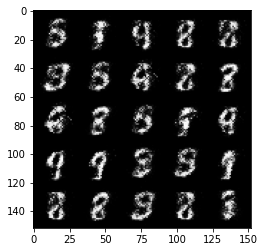

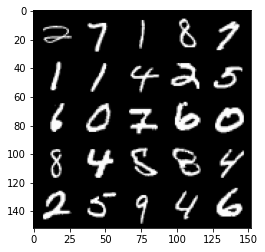

Epoch 24, step 11500: Generator loss: 3.785354286670688, discriminator loss: 0.076996416285634


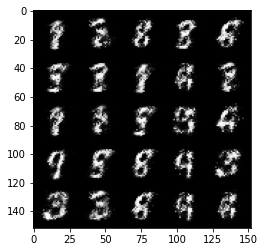

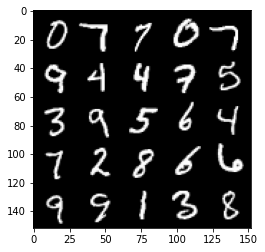

Epoch 25, step 12000: Generator loss: 3.8409952535629306, discriminator loss: 0.07678290014713997


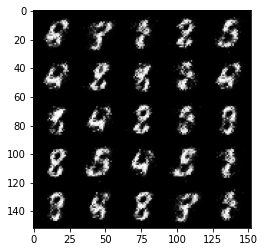

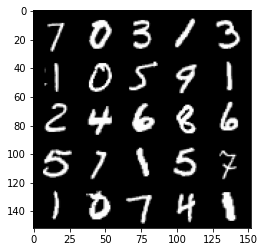

Epoch 26, step 12500: Generator loss: 3.7587122592926034, discriminator loss: 0.08260385662317274


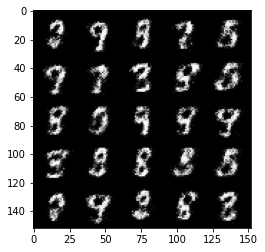

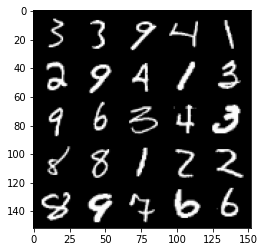

Epoch 27, step 13000: Generator loss: 3.688543080329891, discriminator loss: 0.09028622384369368


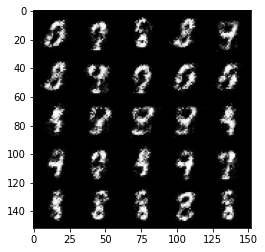

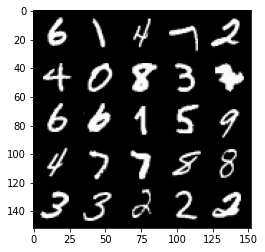

Epoch 28, step 13500: Generator loss: 3.789511720180511, discriminator loss: 0.0859268848150968


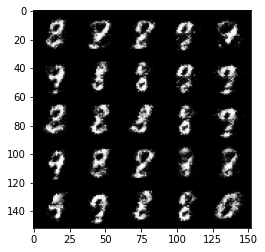

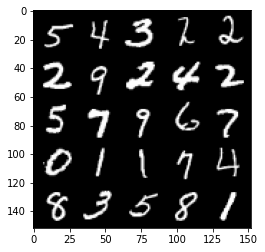

Epoch 29, step 14000: Generator loss: 3.816390148639678, discriminator loss: 0.0898282395526767


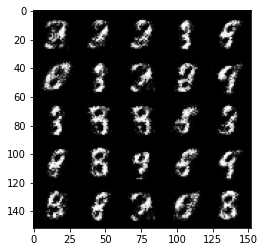

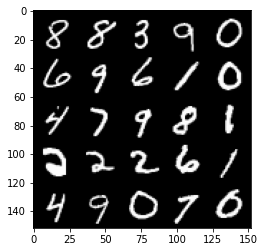

Epoch 30, step 14500: Generator loss: 3.9584827833175673, discriminator loss: 0.0900576093643903


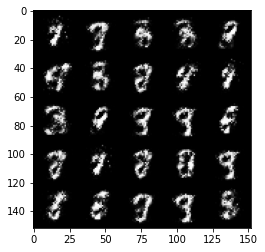

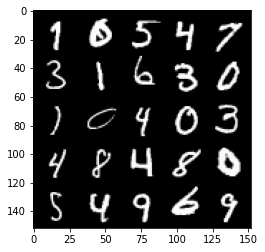

Epoch 31, step 15000: Generator loss: 3.9781992216110216, discriminator loss: 0.09609857897460461


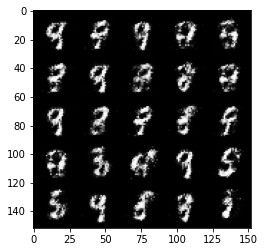

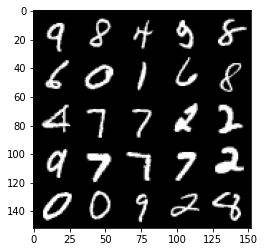

Epoch 33, step 15500: Generator loss: 3.7918116731643674, discriminator loss: 0.11815094638615853


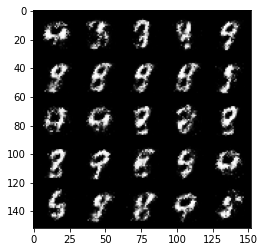

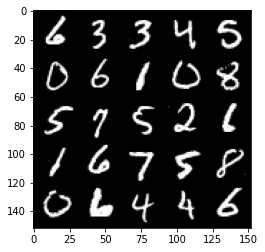

Epoch 34, step 16000: Generator loss: 3.564251617908479, discriminator loss: 0.1332789682745933


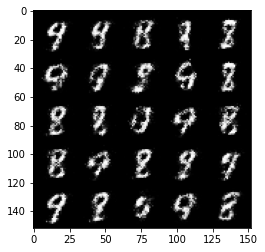

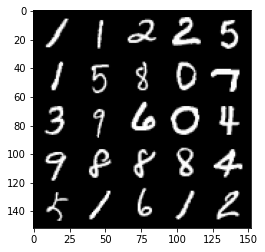

Epoch 35, step 16500: Generator loss: 3.517459254264835, discriminator loss: 0.1327669089287519


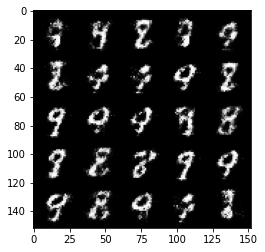

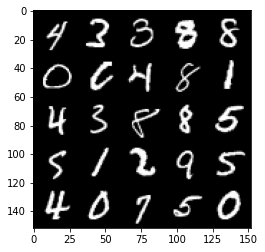

Epoch 36, step 17000: Generator loss: 3.387014852046967, discriminator loss: 0.12496094007790086


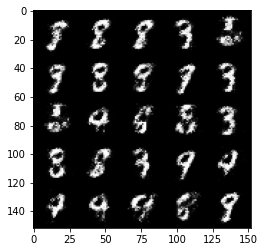

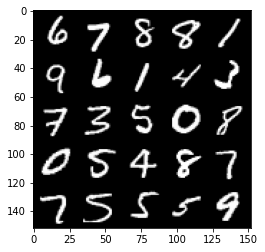

Epoch 37, step 17500: Generator loss: 3.4694487457275374, discriminator loss: 0.12447445566952231


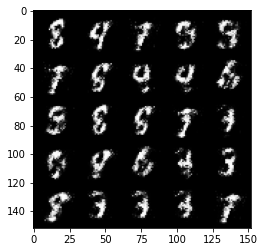

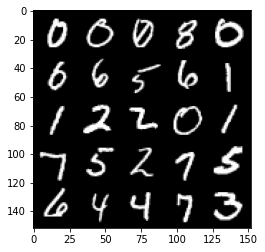

Epoch 38, step 18000: Generator loss: 3.380077920913697, discriminator loss: 0.13024120171368125


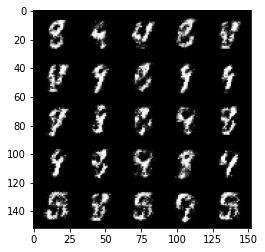

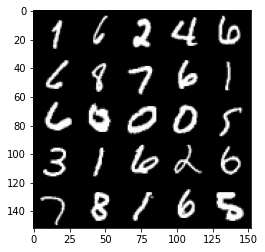

Epoch 39, step 18500: Generator loss: 3.4430195455551136, discriminator loss: 0.13373891809582722


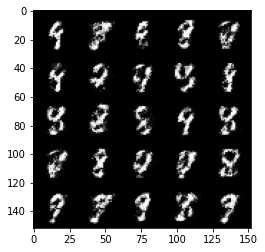

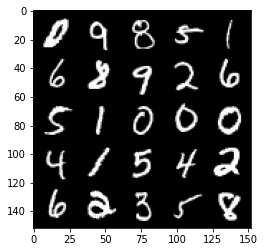

Epoch 40, step 19000: Generator loss: 3.324049276828766, discriminator loss: 0.15980151200294485


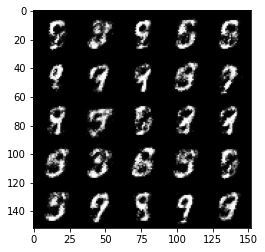

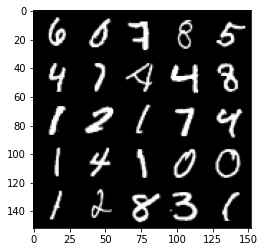

Epoch 41, step 19500: Generator loss: 3.2314970993995646, discriminator loss: 0.15664369006454928


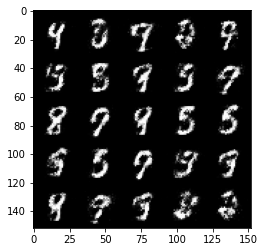

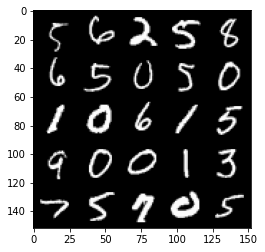

Epoch 42, step 20000: Generator loss: 3.133409783363345, discriminator loss: 0.15787733224034306


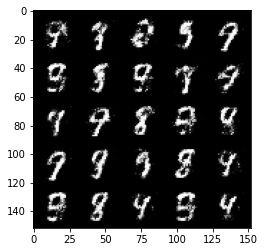

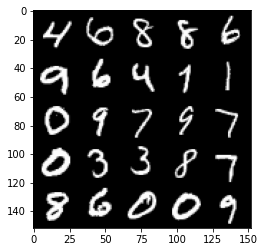

Epoch 43, step 20500: Generator loss: 3.2787025113105743, discriminator loss: 0.14974933025240886


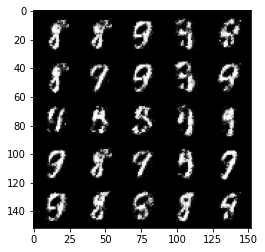

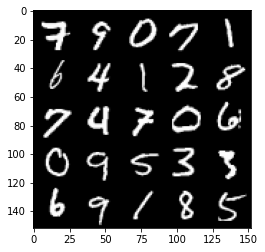

Epoch 44, step 21000: Generator loss: 3.278845939159393, discriminator loss: 0.16254348668456078


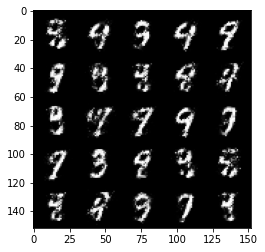

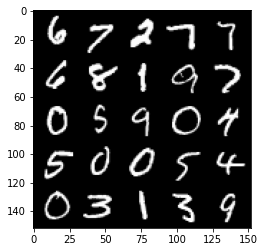

Epoch 45, step 21500: Generator loss: 3.2001407194137603, discriminator loss: 0.17168333092331892


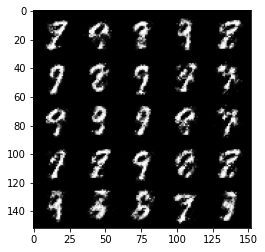

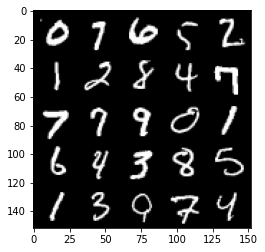

Epoch 46, step 22000: Generator loss: 3.131079075813292, discriminator loss: 0.16727465215325363


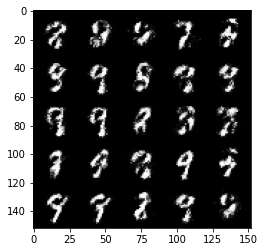

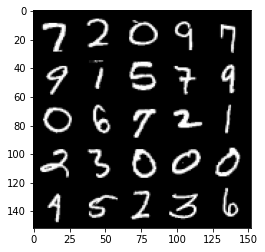

Epoch 47, step 22500: Generator loss: 3.027029637336729, discriminator loss: 0.17807078510522853


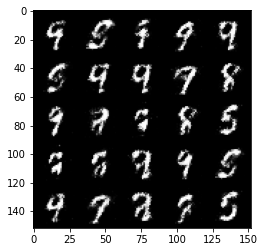

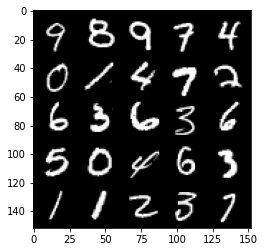

Epoch 49, step 23000: Generator loss: 3.1295421075820937, discriminator loss: 0.16130987876653682


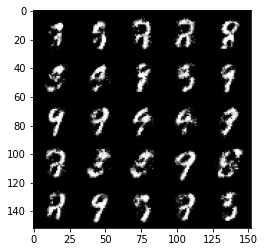

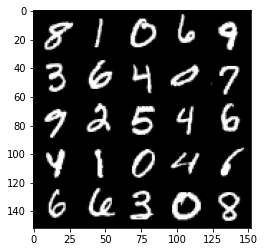

Epoch 50, step 23500: Generator loss: 3.1809193539619462, discriminator loss: 0.16540473738312708


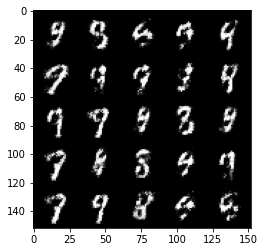

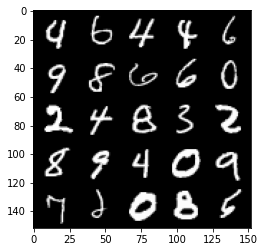

Epoch 51, step 24000: Generator loss: 2.968827476501465, discriminator loss: 0.1868326596170665


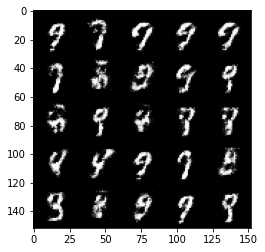

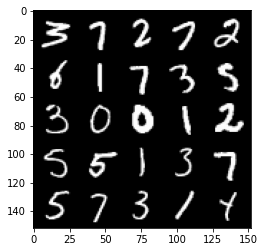

Epoch 52, step 24500: Generator loss: 2.9889524850845355, discriminator loss: 0.17949175874888923


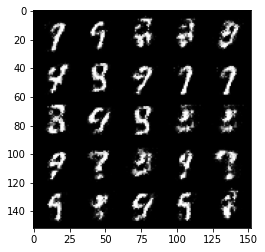

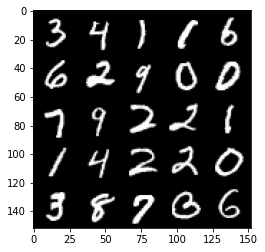

Epoch 53, step 25000: Generator loss: 2.9437625751495373, discriminator loss: 0.19327450399100787


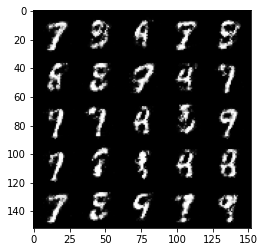

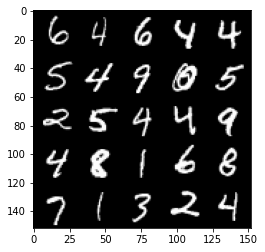

Epoch 54, step 25500: Generator loss: 2.92245530462265, discriminator loss: 0.19194857048988384


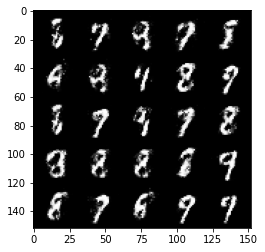

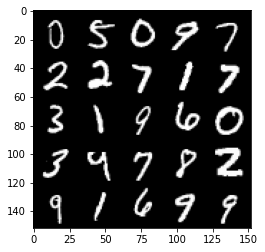

Epoch 55, step 26000: Generator loss: 2.8285586566925063, discriminator loss: 0.21111372007429594


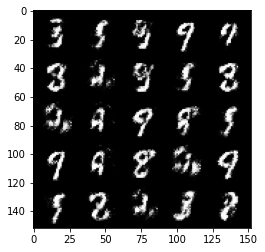

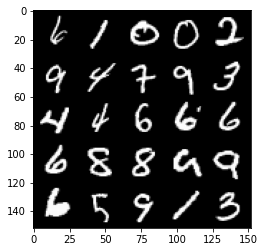

Epoch 56, step 26500: Generator loss: 2.7310252585411074, discriminator loss: 0.21895406621694566


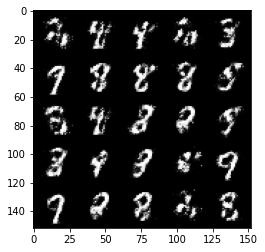

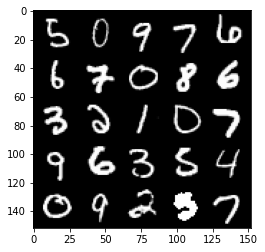

Epoch 57, step 27000: Generator loss: 2.611834824085232, discriminator loss: 0.24565461993217455


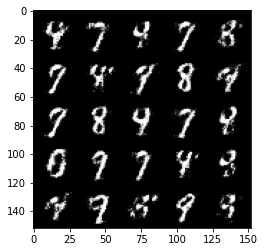

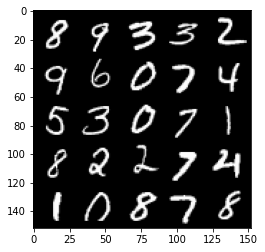

Epoch 58, step 27500: Generator loss: 2.532282795906067, discriminator loss: 0.23429797244071987


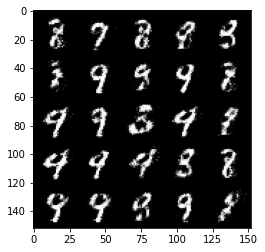

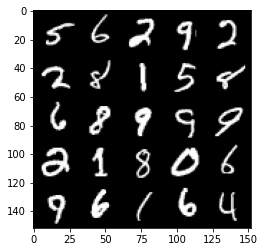

Epoch 59, step 28000: Generator loss: 2.6778652505874665, discriminator loss: 0.2188467681258917


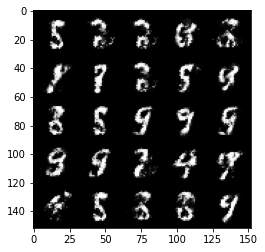

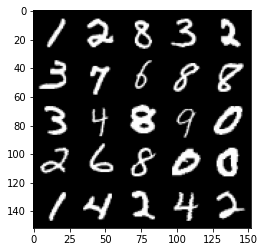

Epoch 60, step 28500: Generator loss: 2.6411718883514417, discriminator loss: 0.2269563507139682


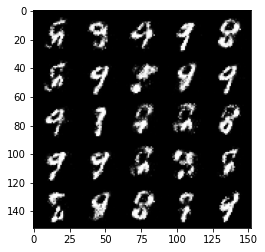

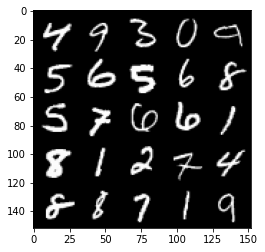

Epoch 61, step 29000: Generator loss: 2.561005508899688, discriminator loss: 0.25905239698290816


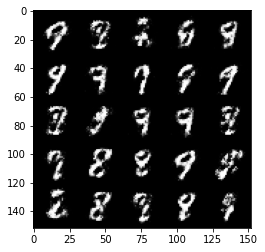

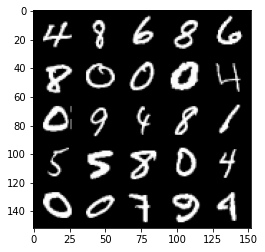

Epoch 62, step 29500: Generator loss: 2.416708662271501, discriminator loss: 0.25765949705243096


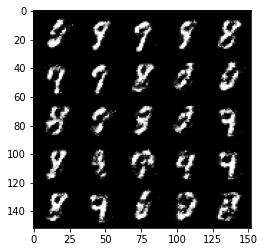

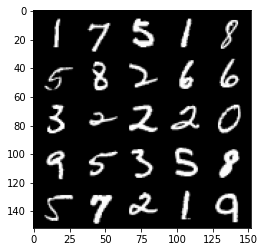

Epoch 63, step 30000: Generator loss: 2.5569199175834676, discriminator loss: 0.23285376735031596


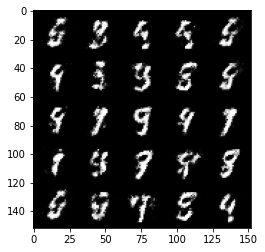

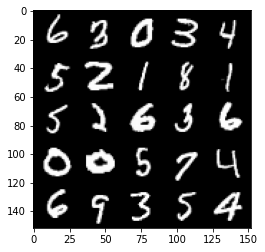

Epoch 65, step 30500: Generator loss: 2.382484124422073, discriminator loss: 0.28536994612216965


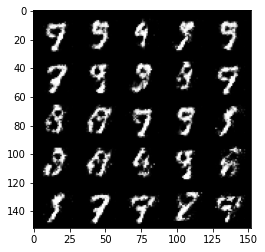

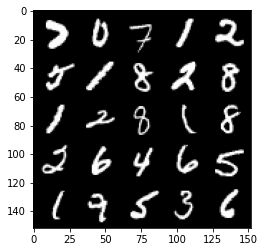

Epoch 66, step 31000: Generator loss: 2.5009214510917666, discriminator loss: 0.23843061912059796


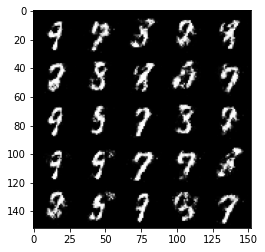

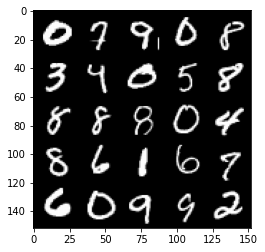

Epoch 67, step 31500: Generator loss: 2.4489271602630613, discriminator loss: 0.24668367046117767


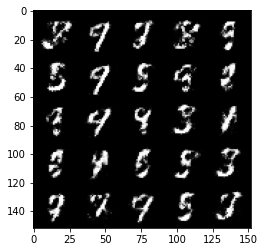

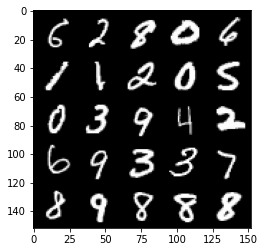

Epoch 68, step 32000: Generator loss: 2.48880609583855, discriminator loss: 0.2669366672337058


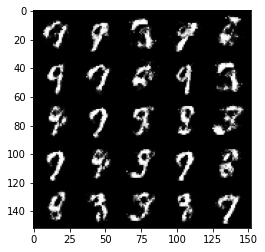

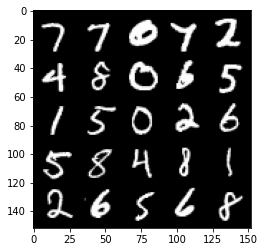

Epoch 69, step 32500: Generator loss: 2.383969687223436, discriminator loss: 0.27416800025105464


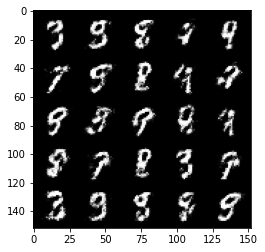

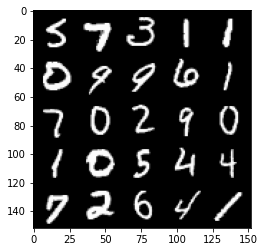

Epoch 70, step 33000: Generator loss: 2.28353311085701, discriminator loss: 0.2774322484135627


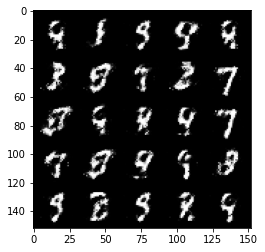

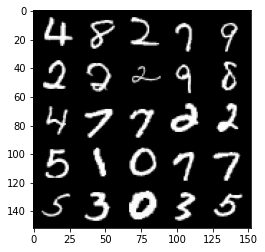

Epoch 71, step 33500: Generator loss: 2.408687724828718, discriminator loss: 0.24846734791994116


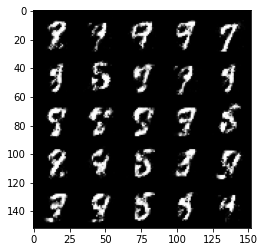

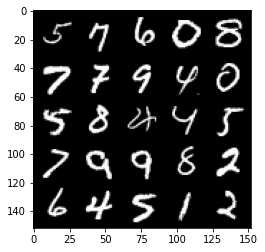

Epoch 72, step 34000: Generator loss: 2.515765333652496, discriminator loss: 0.24473260670900346


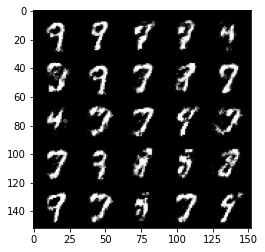

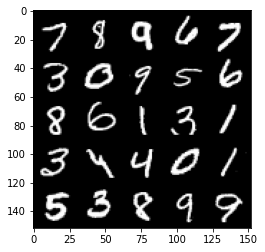

Epoch 73, step 34500: Generator loss: 2.475556979179383, discriminator loss: 0.2539435165822507


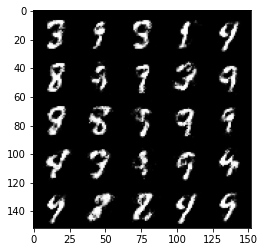

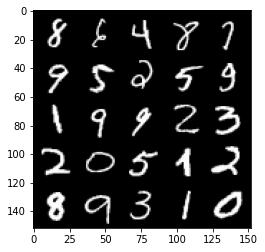

Epoch 74, step 35000: Generator loss: 2.274531599283219, discriminator loss: 0.282000311136246


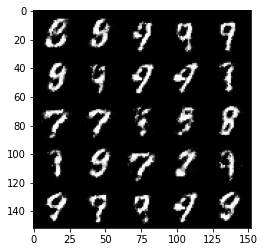

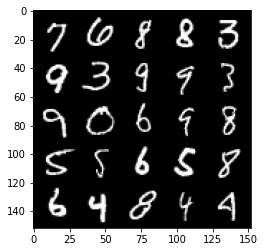

Epoch 75, step 35500: Generator loss: 2.296679417133333, discriminator loss: 0.2752670036554339


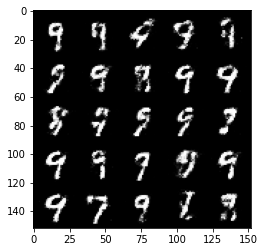

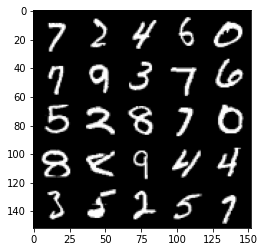

Epoch 76, step 36000: Generator loss: 2.194253613471985, discriminator loss: 0.27684214451909067


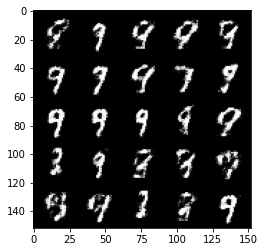

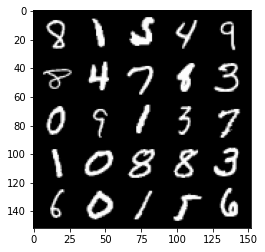

Epoch 77, step 36500: Generator loss: 2.2661340532302874, discriminator loss: 0.28059419524669654


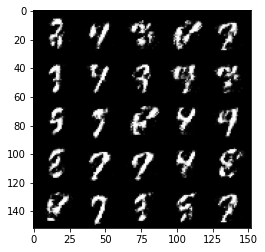

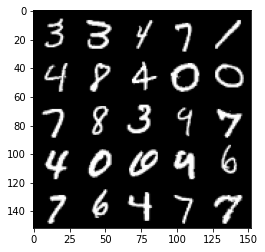

Epoch 78, step 37000: Generator loss: 2.307823436498642, discriminator loss: 0.26175054547190657


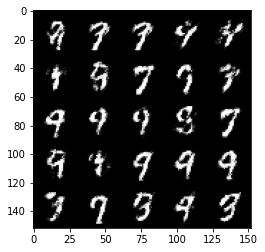

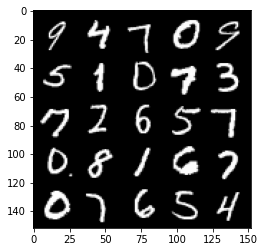

Epoch 79, step 37500: Generator loss: 2.2826605463027945, discriminator loss: 0.2711880738735198


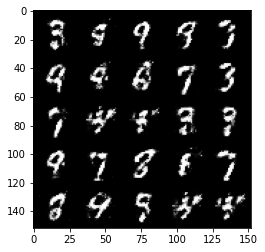

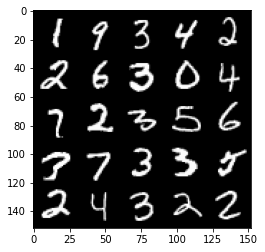

Epoch 81, step 38000: Generator loss: 2.3490459418296794, discriminator loss: 0.26499012622237217


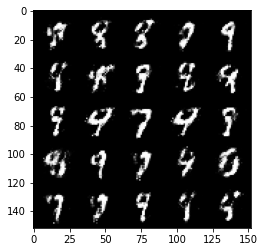

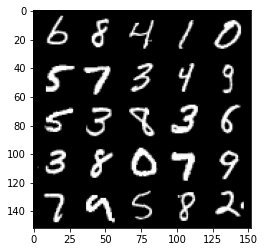

Epoch 82, step 38500: Generator loss: 2.2368514850139634, discriminator loss: 0.2798762135505678


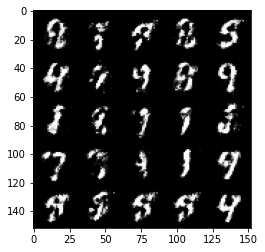

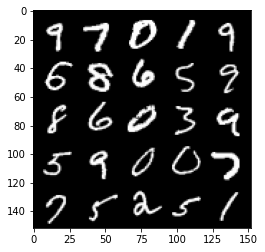

Epoch 83, step 39000: Generator loss: 2.173592606067658, discriminator loss: 0.2835980035662651


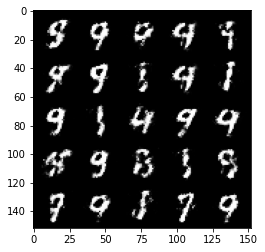

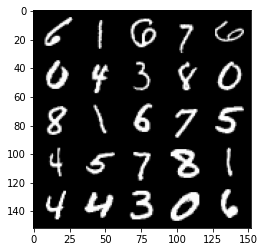

Epoch 84, step 39500: Generator loss: 2.275909704923628, discriminator loss: 0.26754006719589246


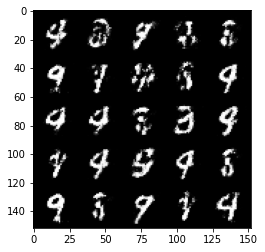

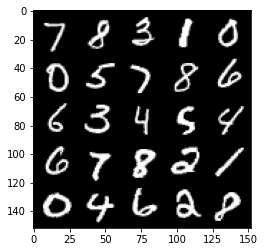

Epoch 85, step 40000: Generator loss: 2.202427575111392, discriminator loss: 0.28671991473436365


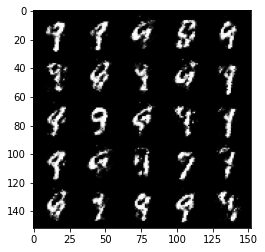

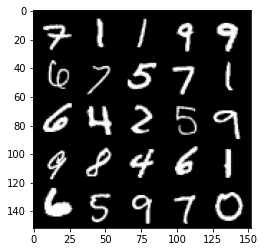

Epoch 86, step 40500: Generator loss: 2.1729909229278563, discriminator loss: 0.28899551114439936


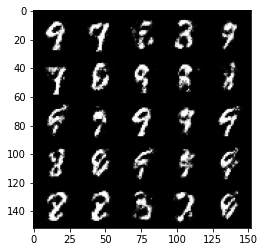

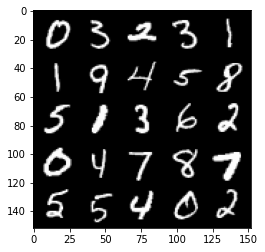

Epoch 87, step 41000: Generator loss: 2.1386373543739308, discriminator loss: 0.29422147113084807


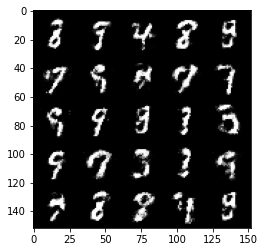

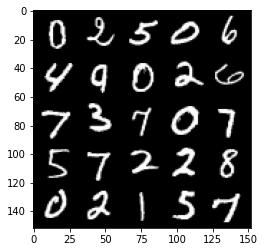

Epoch 88, step 41500: Generator loss: 1.992096792697907, discriminator loss: 0.32974459859728844


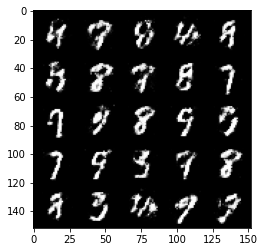

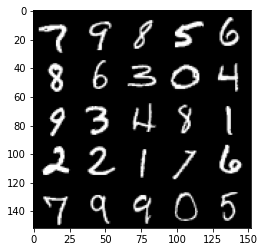

Epoch 89, step 42000: Generator loss: 2.020270483970642, discriminator loss: 0.3204850841462613


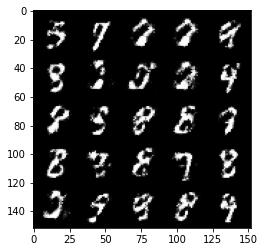

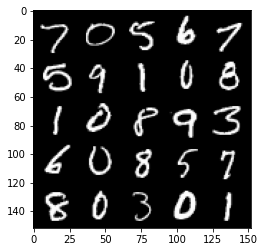

Epoch 90, step 42500: Generator loss: 2.0375874912738787, discriminator loss: 0.30711605978012074


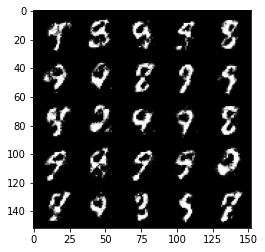

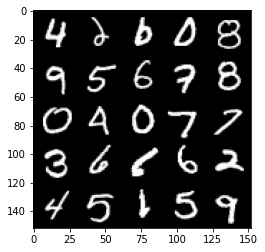

Epoch 91, step 43000: Generator loss: 2.080859456777574, discriminator loss: 0.3052457251846792


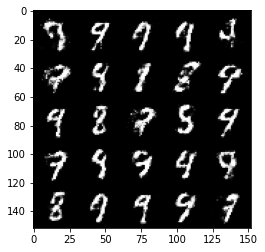

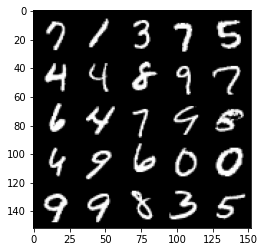

Epoch 92, step 43500: Generator loss: 2.1617948110103584, discriminator loss: 0.2941410745084286


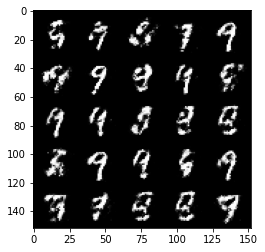

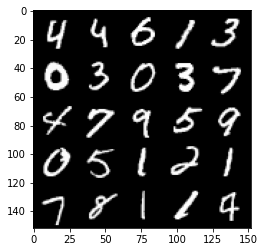

Epoch 93, step 44000: Generator loss: 2.0193759500980386, discriminator loss: 0.33412792435288363


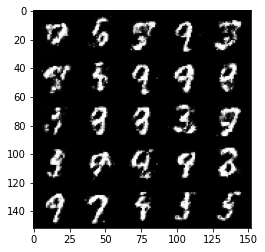

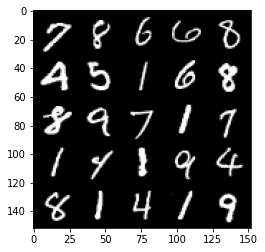

Epoch 94, step 44500: Generator loss: 2.08557770895958, discriminator loss: 0.3008141738772395


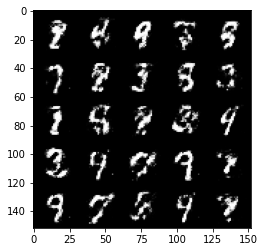

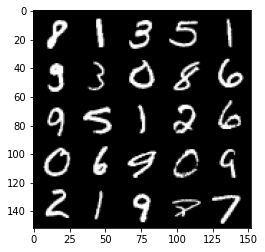

Epoch 95, step 45000: Generator loss: 1.9733460156917564, discriminator loss: 0.338386381804943


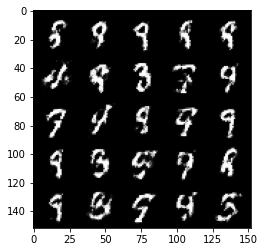

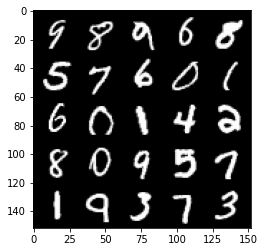

Epoch 97, step 45500: Generator loss: 1.9392538237571706, discriminator loss: 0.339237475782633


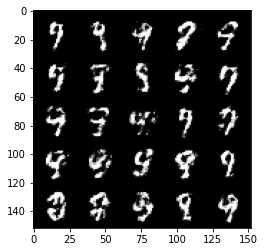

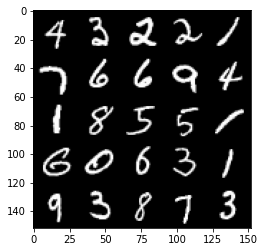

Epoch 98, step 46000: Generator loss: 1.9531964695453643, discriminator loss: 0.33538381737470613


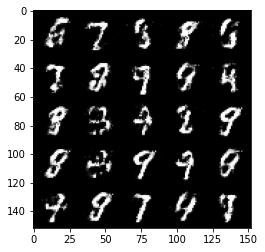

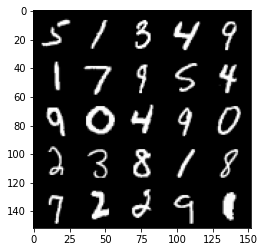

Epoch 99, step 46500: Generator loss: 2.0013111269474027, discriminator loss: 0.3281138281226158


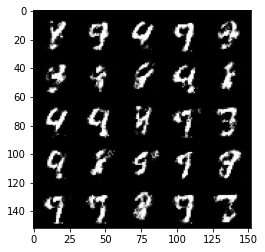

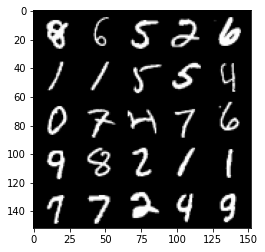

Epoch 100, step 47000: Generator loss: 2.063634160041809, discriminator loss: 0.29785970762372027


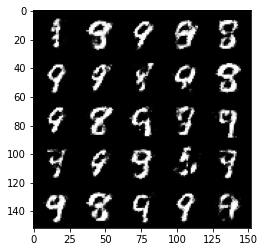

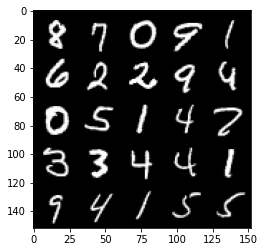

Epoch 101, step 47500: Generator loss: 1.9441888153553006, discriminator loss: 0.3531319417357446


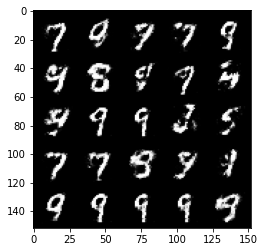

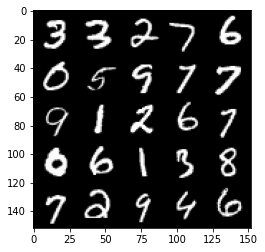

Epoch 102, step 48000: Generator loss: 1.9574176485538484, discriminator loss: 0.31667389813065516


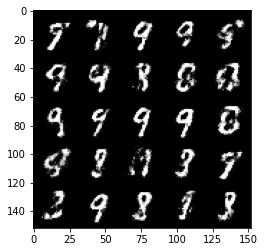

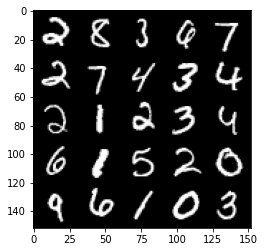

Epoch 103, step 48500: Generator loss: 1.9657653419971481, discriminator loss: 0.31983132708072676


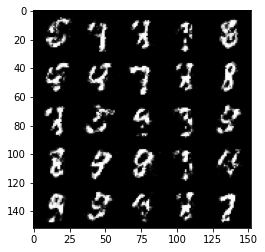

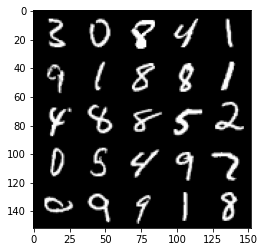

Epoch 104, step 49000: Generator loss: 1.9830812022686015, discriminator loss: 0.31599871993064865


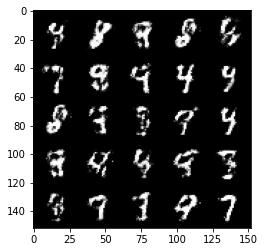

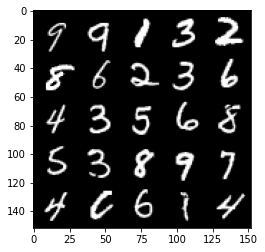

Epoch 105, step 49500: Generator loss: 1.9312057685852047, discriminator loss: 0.33077410310506805


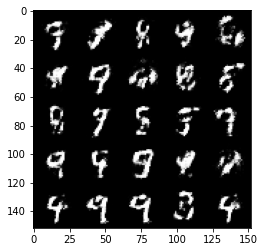

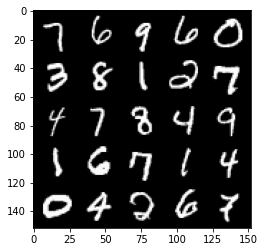

Epoch 106, step 50000: Generator loss: 1.7885981643199909, discriminator loss: 0.3680814076662064


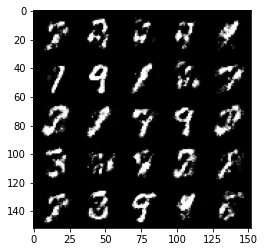

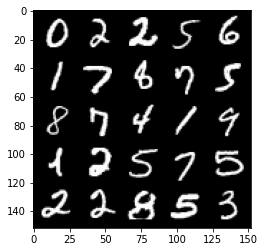

Epoch 107, step 50500: Generator loss: 1.807864916324615, discriminator loss: 0.3712692910432819


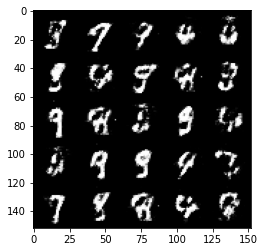

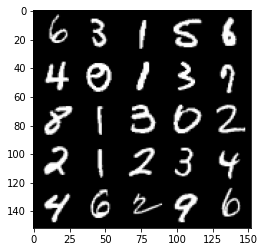

Epoch 108, step 51000: Generator loss: 1.8135846064090702, discriminator loss: 0.35723400533199295


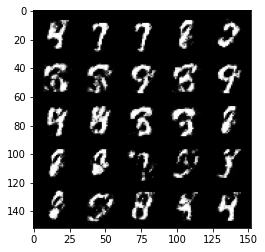

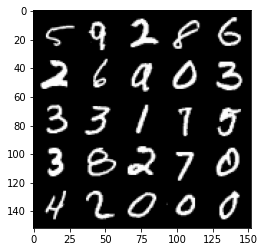

Epoch 109, step 51500: Generator loss: 1.810188129186631, discriminator loss: 0.3519127087295057


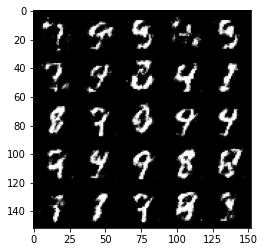

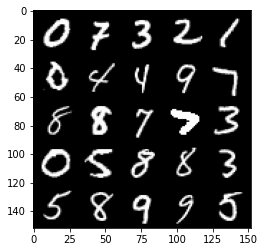

Epoch 110, step 52000: Generator loss: 1.9178738741874677, discriminator loss: 0.33682561489939733


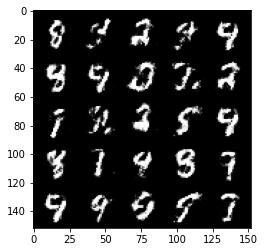

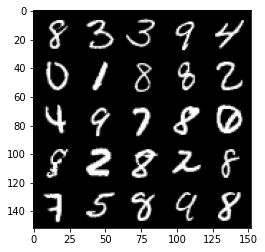

Epoch 111, step 52500: Generator loss: 1.8415781195163727, discriminator loss: 0.3562879455685615


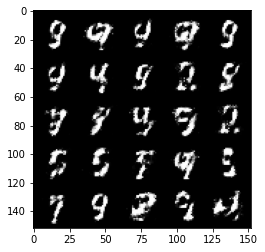

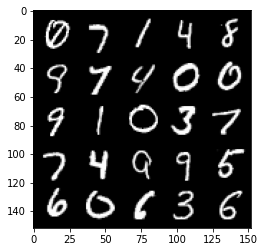

Epoch 113, step 53000: Generator loss: 1.9735626578331005, discriminator loss: 0.3236834158003328


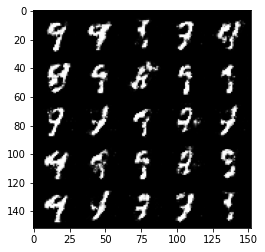

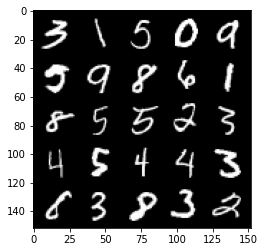

Epoch 114, step 53500: Generator loss: 1.9097040174007422, discriminator loss: 0.3400413486063478


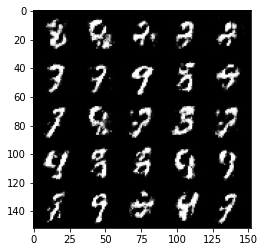

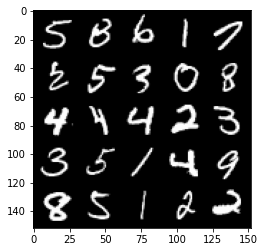

Epoch 115, step 54000: Generator loss: 1.9616436548233054, discriminator loss: 0.32806877228617704


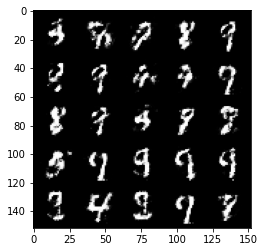

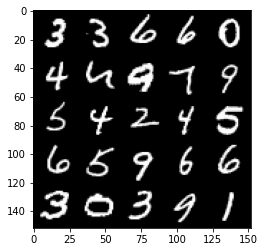

Epoch 116, step 54500: Generator loss: 1.8489420237541214, discriminator loss: 0.35103149503469433


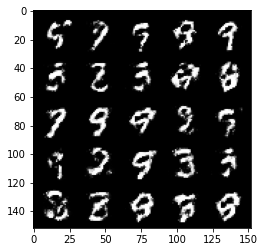

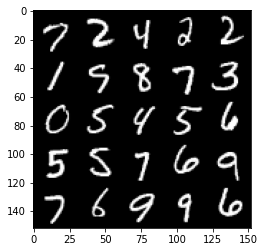

Epoch 117, step 55000: Generator loss: 1.7877083997726437, discriminator loss: 0.3571530047059057


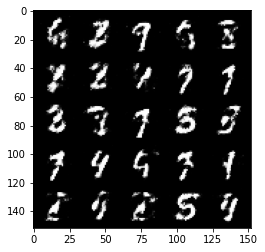

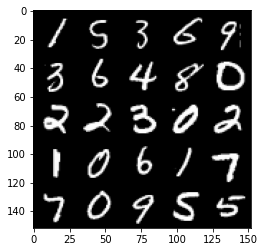

Epoch 118, step 55500: Generator loss: 1.7698357670307159, discriminator loss: 0.35777527576684937


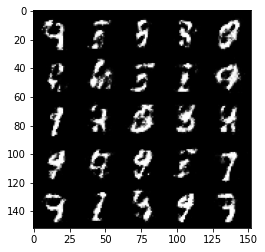

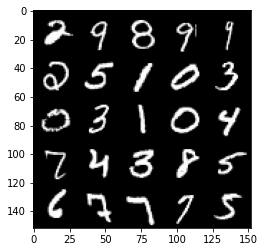

Epoch 119, step 56000: Generator loss: 1.7491958956718432, discriminator loss: 0.3698357042074204


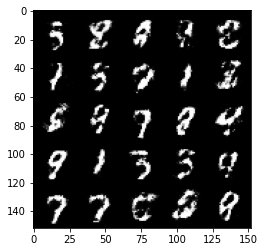

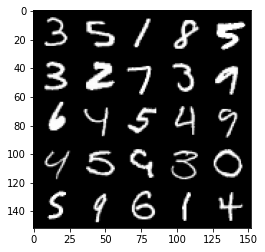

Epoch 120, step 56500: Generator loss: 1.7490234916210157, discriminator loss: 0.36476898008584996


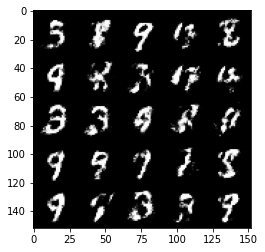

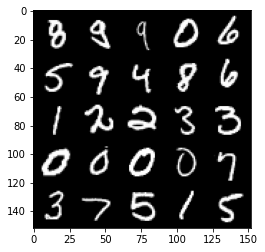

Epoch 121, step 57000: Generator loss: 1.7798266291618345, discriminator loss: 0.3568745588660238


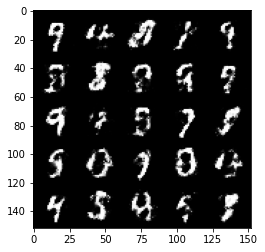

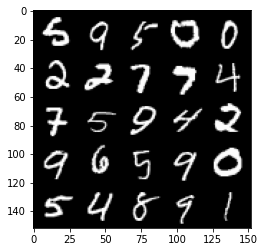

Epoch 122, step 57500: Generator loss: 1.7494743926525096, discriminator loss: 0.36084930342435784


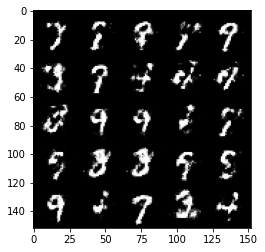

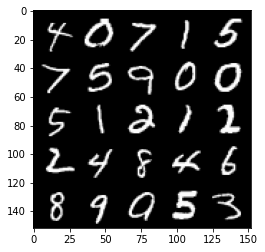

Epoch 123, step 58000: Generator loss: 1.7967447097301492, discriminator loss: 0.3556268918514251


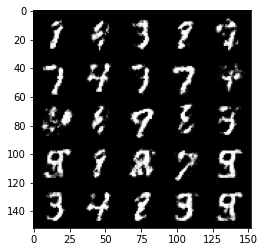

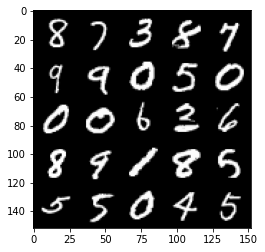

Epoch 124, step 58500: Generator loss: 1.6751464805603022, discriminator loss: 0.382552685201168


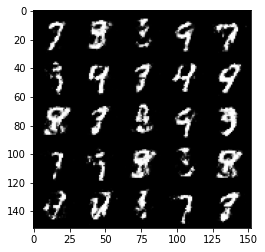

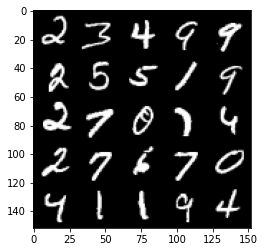

Epoch 125, step 59000: Generator loss: 1.7058246209621426, discriminator loss: 0.371373557984829


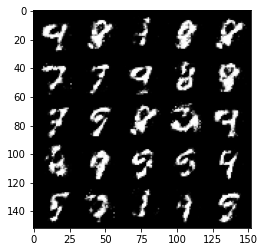

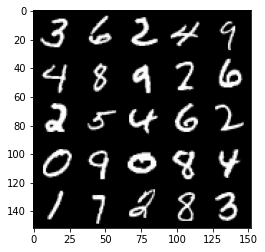

Epoch 126, step 59500: Generator loss: 1.7244240438938139, discriminator loss: 0.3741390071511269


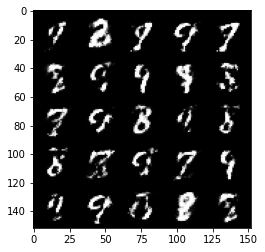

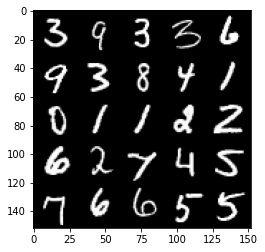

Epoch 127, step 60000: Generator loss: 1.6962108964920062, discriminator loss: 0.38311681920290014


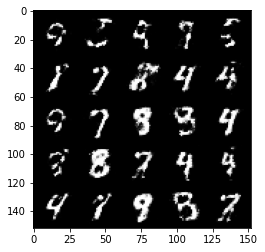

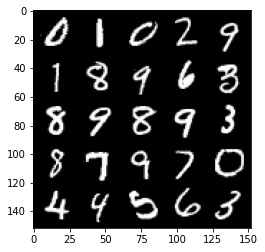

Epoch 128, step 60500: Generator loss: 1.634726302623748, discriminator loss: 0.3949908557534218


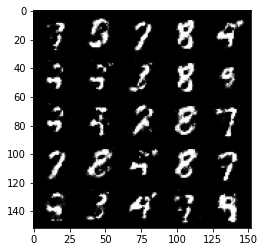

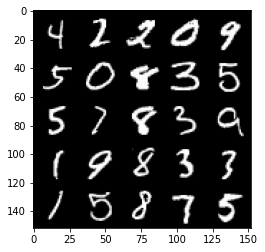

Epoch 130, step 61000: Generator loss: 1.7001210584640485, discriminator loss: 0.3716719676852224


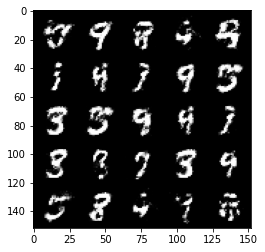

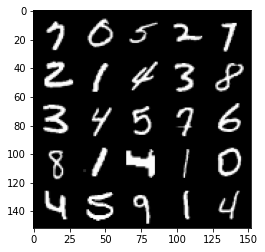

Epoch 131, step 61500: Generator loss: 1.660250807762146, discriminator loss: 0.38730284416675576


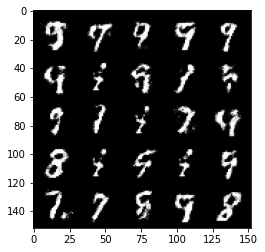

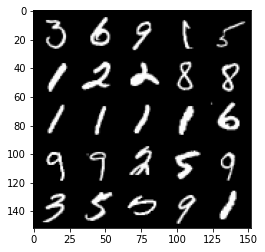

Epoch 132, step 62000: Generator loss: 1.6589889705181111, discriminator loss: 0.380652491986752


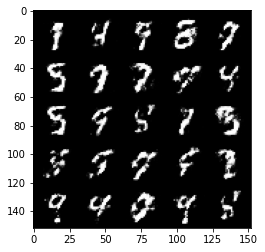

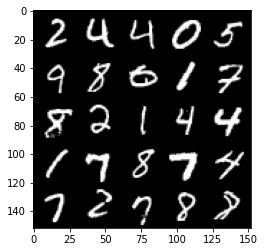

Epoch 133, step 62500: Generator loss: 1.6373482186794284, discriminator loss: 0.3785538393855093


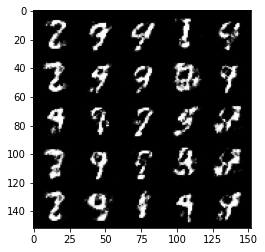

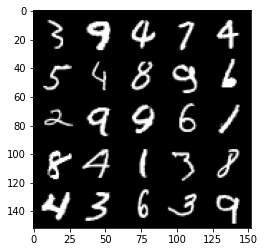

Epoch 134, step 63000: Generator loss: 1.6670323457717895, discriminator loss: 0.3928220311999321


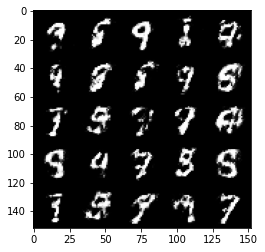

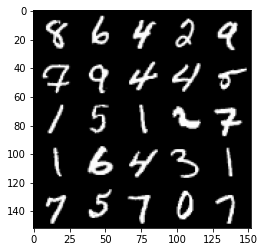

Epoch 135, step 63500: Generator loss: 1.518741627693178, discriminator loss: 0.4256871811747553


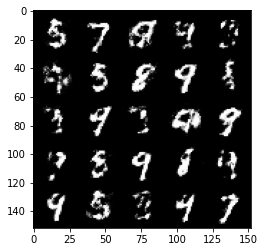

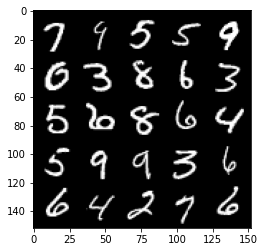

Epoch 136, step 64000: Generator loss: 1.5779330315589897, discriminator loss: 0.4004938997626308


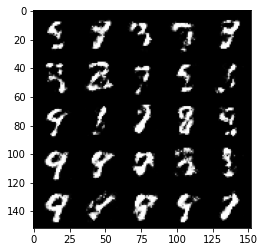

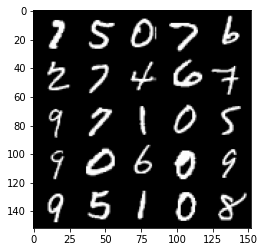

Epoch 137, step 64500: Generator loss: 1.543583412647247, discriminator loss: 0.4105326661467555


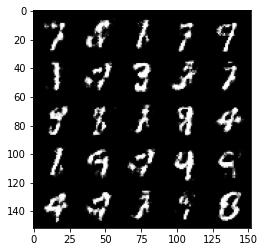

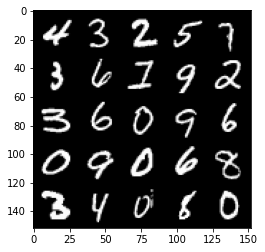

Epoch 138, step 65000: Generator loss: 1.5845182180404673, discriminator loss: 0.40435666787624347


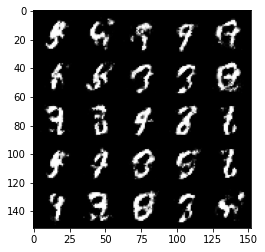

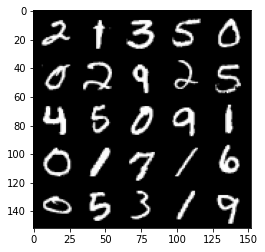

Epoch 139, step 65500: Generator loss: 1.6777371895313276, discriminator loss: 0.3678552752733231


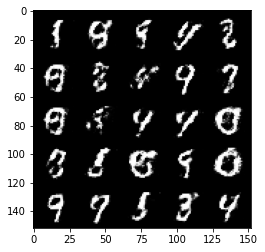

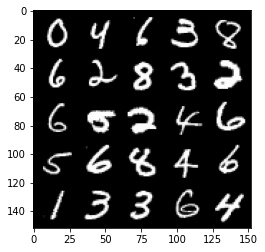

Epoch 140, step 66000: Generator loss: 1.7095513939857496, discriminator loss: 0.3739796565175061


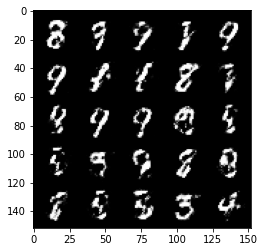

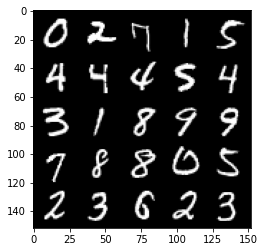

Epoch 141, step 66500: Generator loss: 1.592178401947023, discriminator loss: 0.4087561161518099


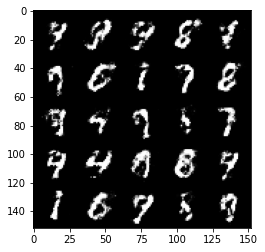

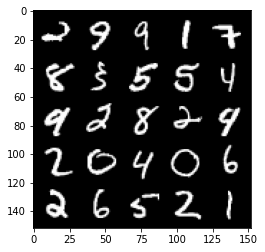

Epoch 142, step 67000: Generator loss: 1.6449700469970703, discriminator loss: 0.3821037639379503


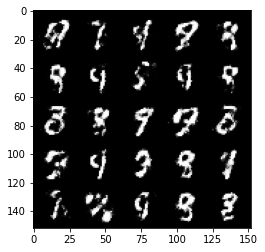

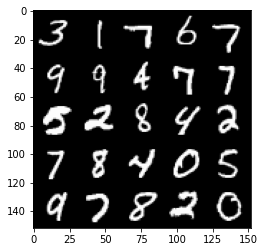

Epoch 143, step 67500: Generator loss: 1.5694695785045623, discriminator loss: 0.4034662158489229


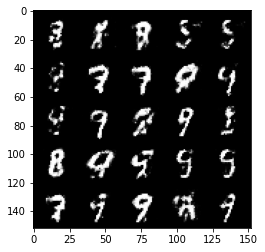

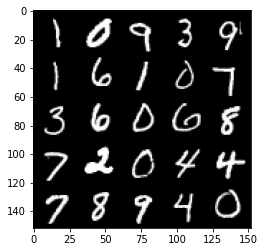

Epoch 144, step 68000: Generator loss: 1.5752753372192396, discriminator loss: 0.3992563619017601


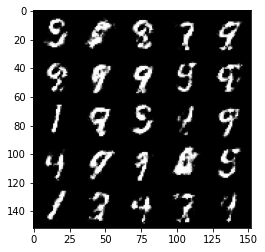

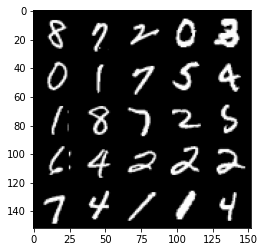

Epoch 146, step 68500: Generator loss: 1.620147327899933, discriminator loss: 0.39029972690343884


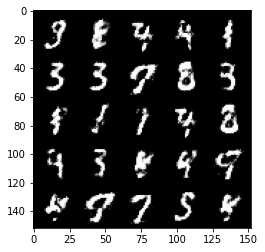

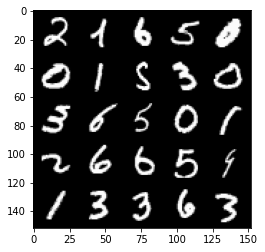

Epoch 147, step 69000: Generator loss: 1.5410363738536832, discriminator loss: 0.42921551376581174


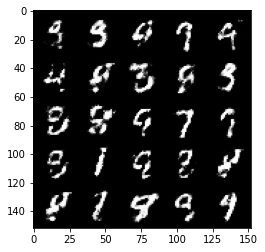

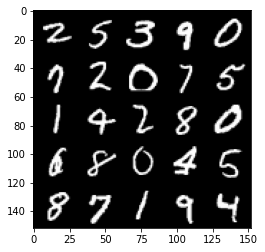

Epoch 148, step 69500: Generator loss: 1.5451866979598985, discriminator loss: 0.4056658930778506


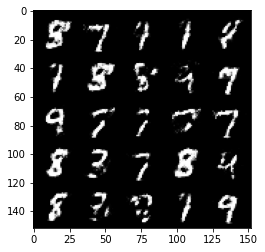

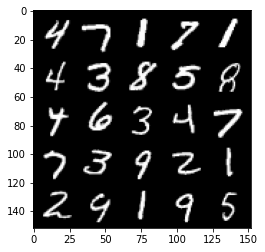

Epoch 149, step 70000: Generator loss: 1.5220427083969108, discriminator loss: 0.4049911636710172


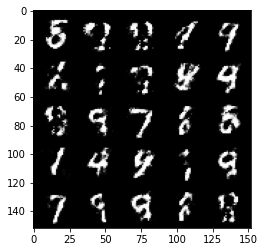

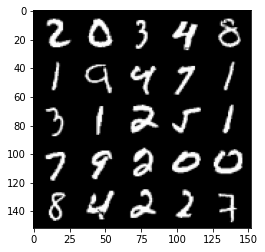

Epoch 150, step 70500: Generator loss: 1.5393249855041495, discriminator loss: 0.41031662917137146


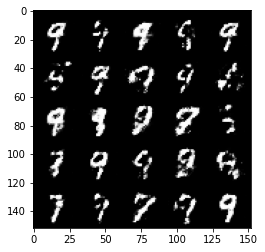

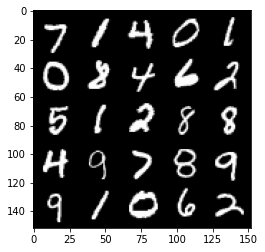

Epoch 151, step 71000: Generator loss: 1.500866839408874, discriminator loss: 0.42200180566310935


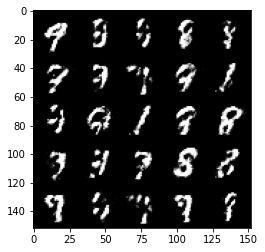

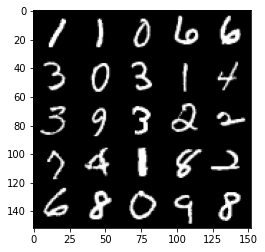

Epoch 152, step 71500: Generator loss: 1.4269955177307132, discriminator loss: 0.44505169874429723


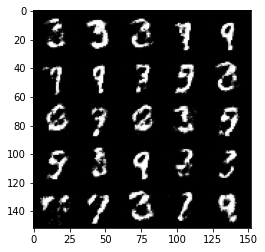

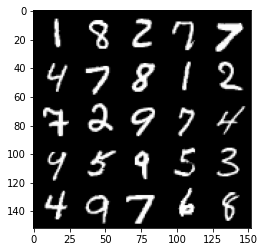

Epoch 153, step 72000: Generator loss: 1.5486051337718962, discriminator loss: 0.39993959969282217


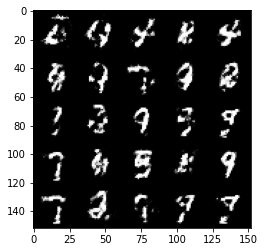

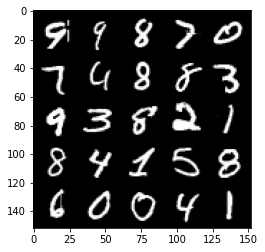

Epoch 154, step 72500: Generator loss: 1.545233964920045, discriminator loss: 0.4097105996608728


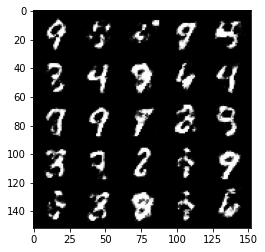

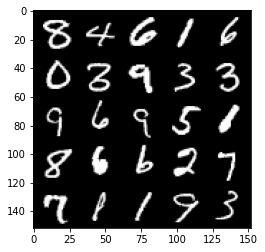

Epoch 155, step 73000: Generator loss: 1.5180002045631416, discriminator loss: 0.40385333257913586


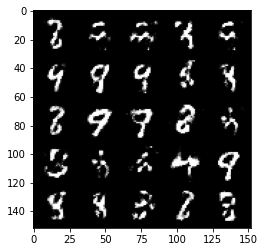

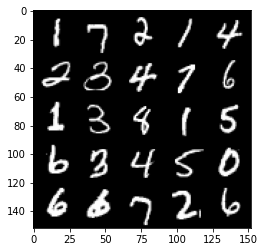

Epoch 156, step 73500: Generator loss: 1.4972085745334627, discriminator loss: 0.4284237006902692


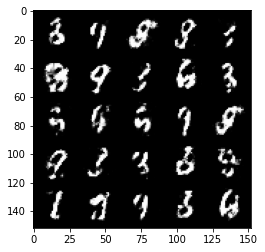

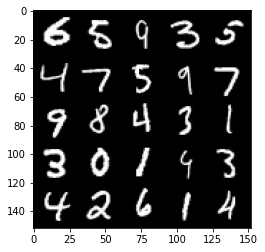

Epoch 157, step 74000: Generator loss: 1.4620284190177915, discriminator loss: 0.4346402567625044


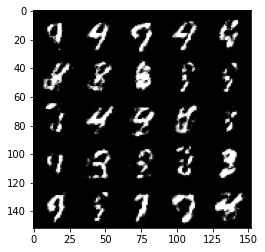

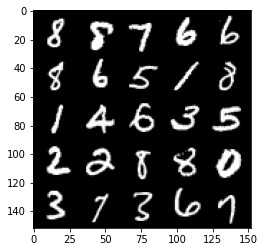

Epoch 158, step 74500: Generator loss: 1.4432028279304496, discriminator loss: 0.430356554865837


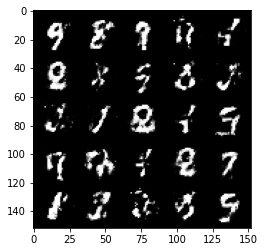

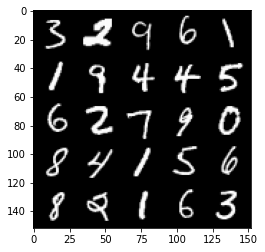

Epoch 159, step 75000: Generator loss: 1.4847656123638133, discriminator loss: 0.4215587368607521


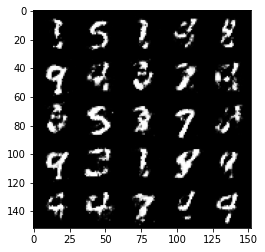

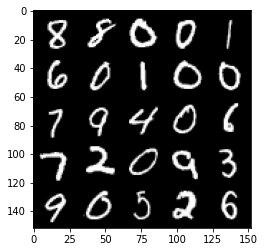

Epoch 160, step 75500: Generator loss: 1.5046135430335996, discriminator loss: 0.41589617776870735


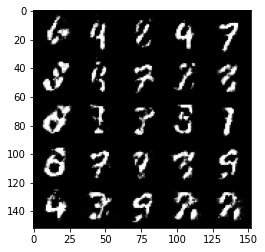

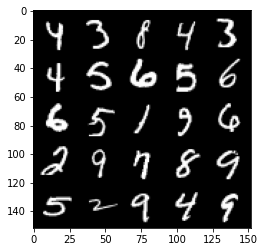

Epoch 162, step 76000: Generator loss: 1.4457526292800904, discriminator loss: 0.43523462563753085


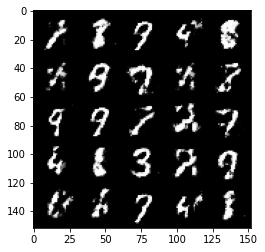

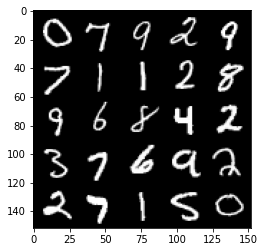

Epoch 163, step 76500: Generator loss: 1.4725770390033712, discriminator loss: 0.4148002583384513


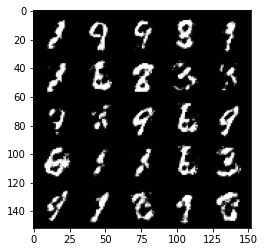

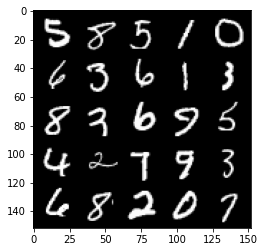

Epoch 164, step 77000: Generator loss: 1.5066101510524745, discriminator loss: 0.41323013699054795


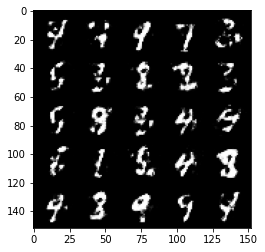

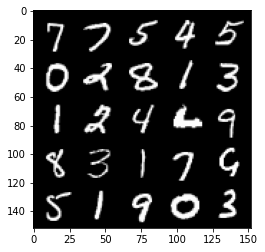

Epoch 165, step 77500: Generator loss: 1.4716019806861873, discriminator loss: 0.41805989474058136


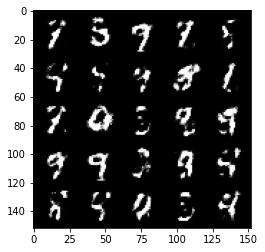

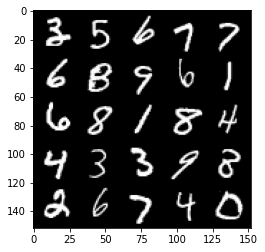

Epoch 166, step 78000: Generator loss: 1.4826081030368798, discriminator loss: 0.39958103454113


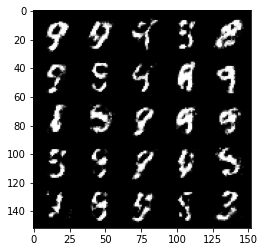

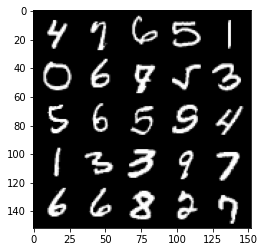

Epoch 167, step 78500: Generator loss: 1.4638671782016737, discriminator loss: 0.42418999516963923


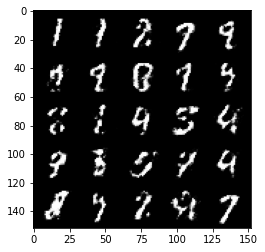

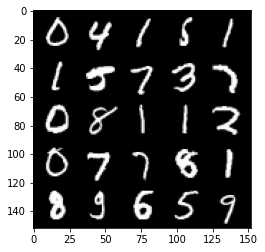

Epoch 168, step 79000: Generator loss: 1.4455604615211493, discriminator loss: 0.43829909998178507


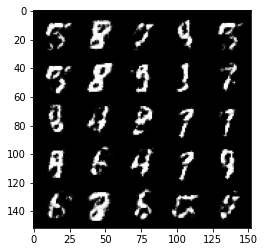

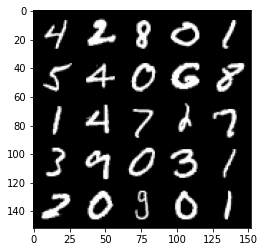

Epoch 169, step 79500: Generator loss: 1.381856582403183, discriminator loss: 0.45495123600959775


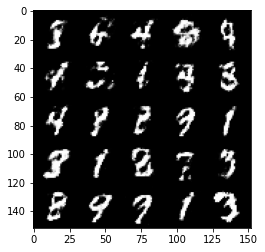

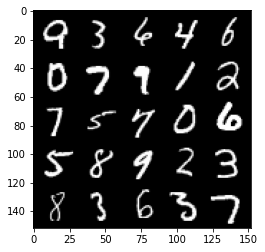

Epoch 170, step 80000: Generator loss: 1.3126810317039495, discriminator loss: 0.46999212419986763


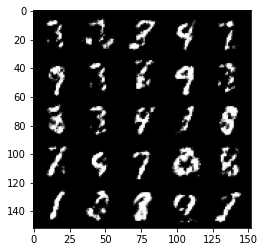

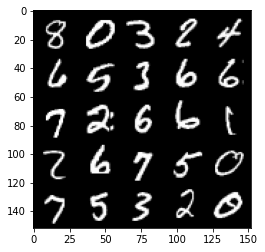

Epoch 171, step 80500: Generator loss: 1.395921157121658, discriminator loss: 0.4522262139320377


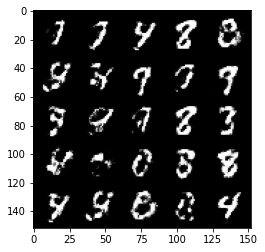

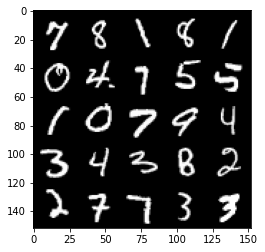

Epoch 172, step 81000: Generator loss: 1.4297516095638276, discriminator loss: 0.43681600981950786


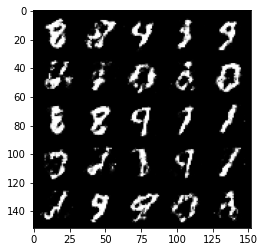

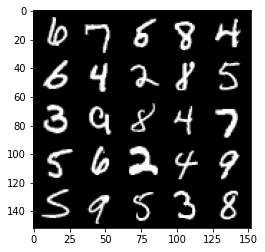

Epoch 173, step 81500: Generator loss: 1.4208252780437478, discriminator loss: 0.44624305188655833


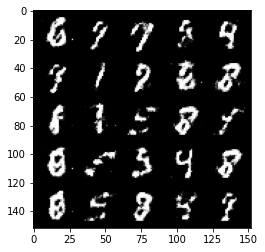

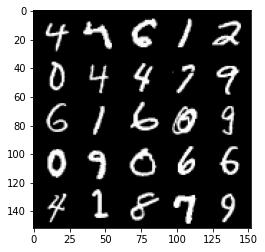

Epoch 174, step 82000: Generator loss: 1.323514616012572, discriminator loss: 0.4716049814820288


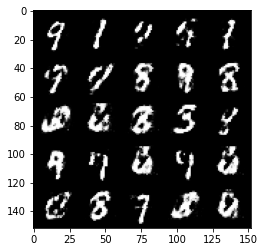

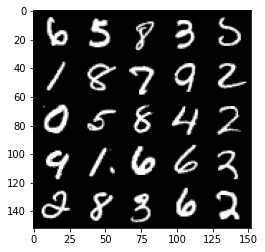

Epoch 175, step 82500: Generator loss: 1.3509097368717187, discriminator loss: 0.4530292276144024


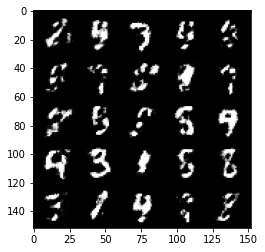

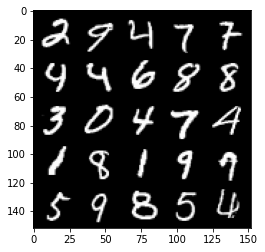

Epoch 176, step 83000: Generator loss: 1.3455670533180244, discriminator loss: 0.4549486295580862


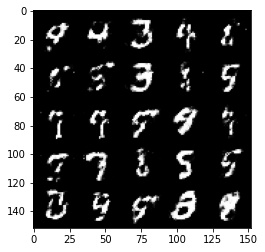

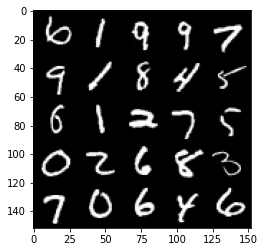

Epoch 178, step 83500: Generator loss: 1.4141776208877557, discriminator loss: 0.4417340434193613


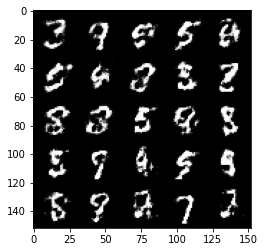

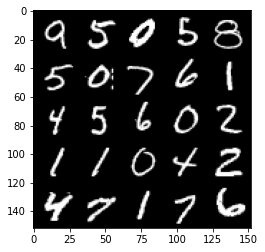

Epoch 179, step 84000: Generator loss: 1.4061139571666725, discriminator loss: 0.44617813748121266


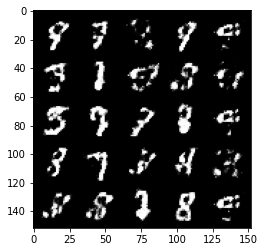

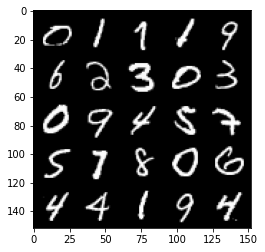

Epoch 180, step 84500: Generator loss: 1.410556379795075, discriminator loss: 0.43746807169914226


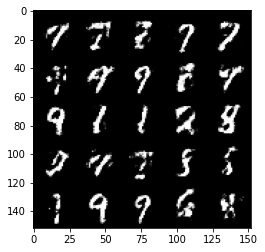

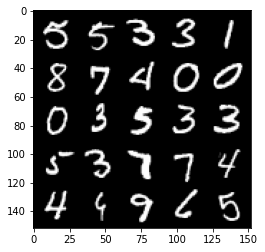

Epoch 181, step 85000: Generator loss: 1.3665749666690812, discriminator loss: 0.4631772264242175


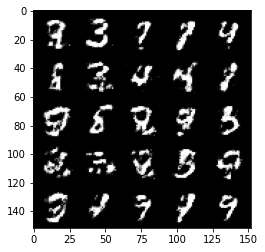

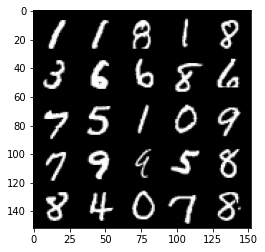

Epoch 182, step 85500: Generator loss: 1.2952501747608174, discriminator loss: 0.4829322771430016


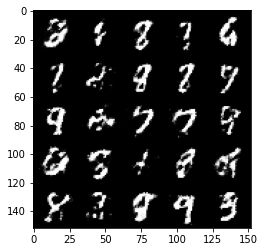

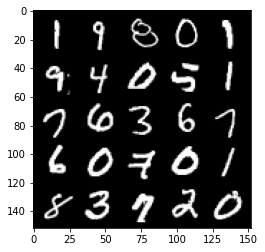

Epoch 183, step 86000: Generator loss: 1.3215561556816096, discriminator loss: 0.4677295769453049


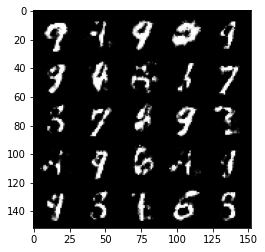

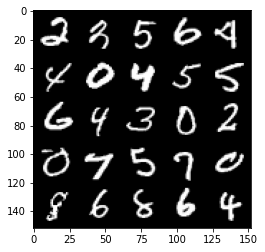

Epoch 184, step 86500: Generator loss: 1.2467400956153867, discriminator loss: 0.4818336605429649


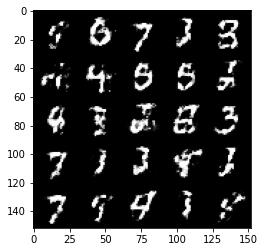

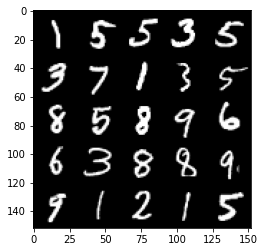

Epoch 185, step 87000: Generator loss: 1.3095644528865815, discriminator loss: 0.4713377754688266


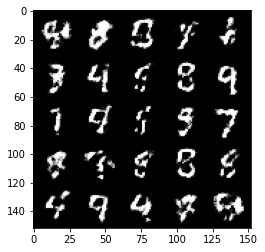

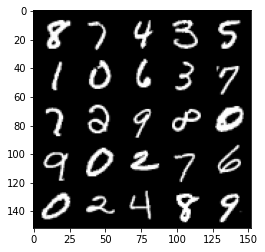

Epoch 186, step 87500: Generator loss: 1.374358726024628, discriminator loss: 0.44451821380853596


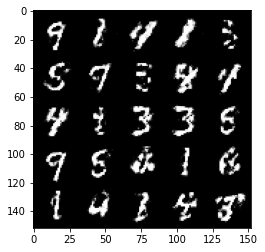

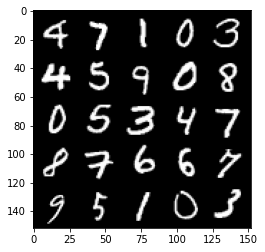

Epoch 187, step 88000: Generator loss: 1.3074509172439572, discriminator loss: 0.4727832802534103


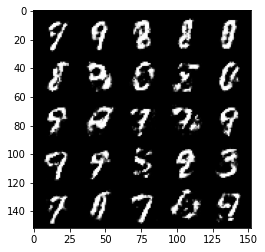

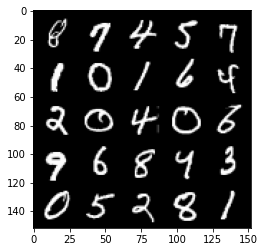

Epoch 188, step 88500: Generator loss: 1.3515122830867772, discriminator loss: 0.4603754317760463


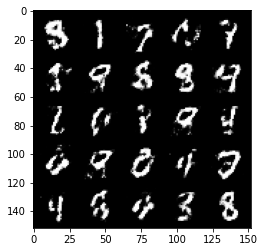

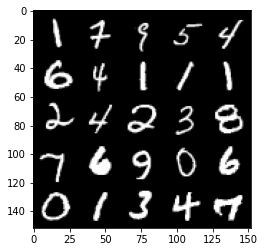

Epoch 189, step 89000: Generator loss: 1.3187723155021671, discriminator loss: 0.4745715512633322


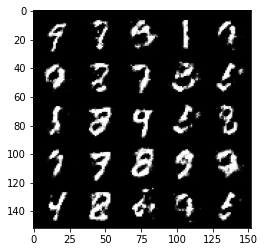

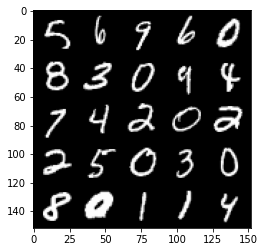

Epoch 190, step 89500: Generator loss: 1.3083376224040968, discriminator loss: 0.47422272145748146


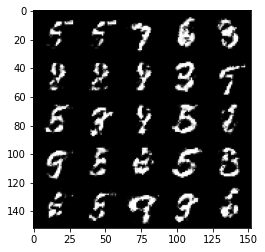

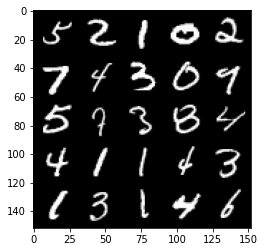

Epoch 191, step 90000: Generator loss: 1.2321379170417774, discriminator loss: 0.4965065227746967


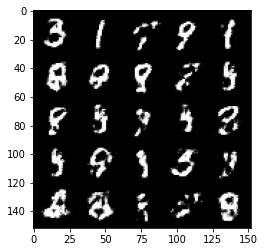

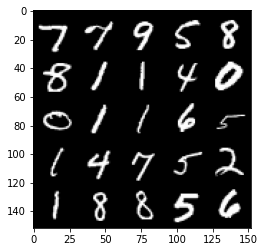

Epoch 192, step 90500: Generator loss: 1.2670156426429757, discriminator loss: 0.47765094012022


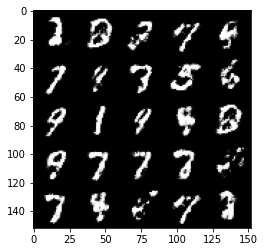

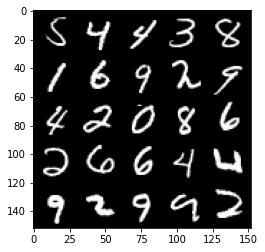

Epoch 194, step 91000: Generator loss: 1.2890699577331541, discriminator loss: 0.4632866130471228


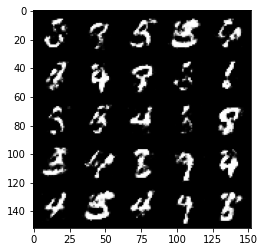

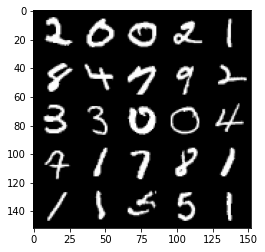

Epoch 195, step 91500: Generator loss: 1.2417766852378849, discriminator loss: 0.4896520250439646


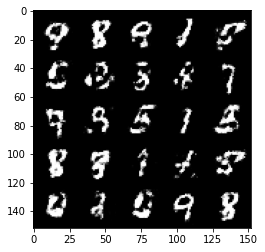

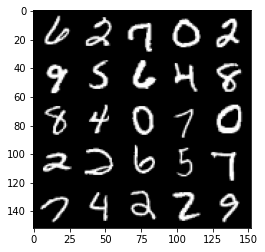

Epoch 196, step 92000: Generator loss: 1.2377629859447492, discriminator loss: 0.4817415834069251


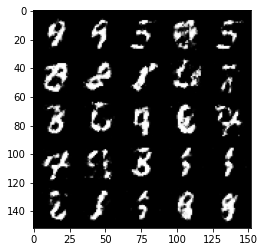

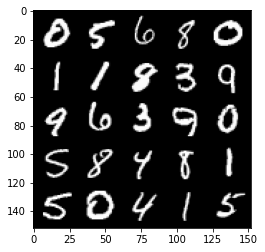

Epoch 197, step 92500: Generator loss: 1.2867514960765845, discriminator loss: 0.46280821752548157


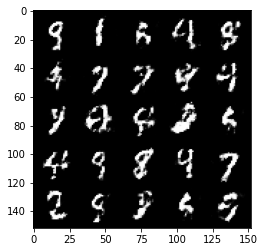

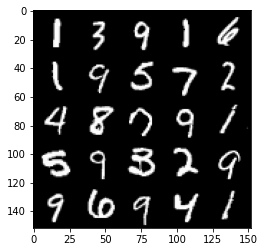

Epoch 198, step 93000: Generator loss: 1.3383073861598966, discriminator loss: 0.46170499002933496


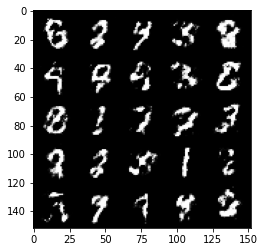

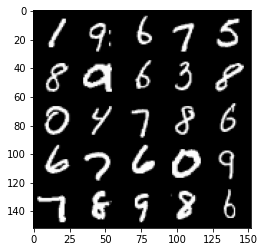

Epoch 199, step 93500: Generator loss: 1.2256777645349504, discriminator loss: 0.49755074089765555


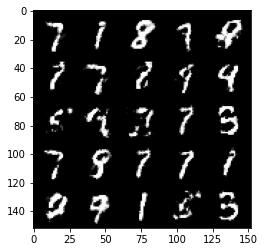

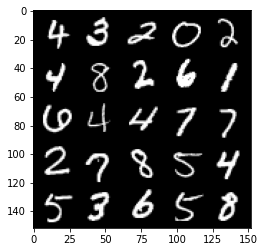

In [16]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        real = real.view(cur_batch_size, -1).to(device)

        disc_opt.zero_grad()

        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        disc_loss.backward(retain_graph=True)

        disc_opt.step()

        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1